<a href="https://colab.research.google.com/github/MateusAnjos10/ProjetoDataScience/blob/main/trabalhobimstral.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
Trabalho Bimestral
ALUNO: LUCAS NATHAN DE OLIVEIRA

ALUNO: MATEUS DOS ANJOS 

TURMA: Data Science - Osório - QUARTA FEIRA

IMPORTANDO AS BIBLIOTECAS PANDA E NUMPY E PERMITINDO ACESSO AO DRIVE.

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

sns.set()

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


CONECTAR O DATASET AO ARQUIVO DE ENFARMEGEM CSV


In [2]:
%matplotlib inline

df = pd.read_csv('/content/drive/MyDrive/ciencia_de_dados/trabalho data/2022-10-06_Sistema_E-Saude_Enfermagem_-_Base_de_Dados.csv', 
                 sep=';', encoding='latin-1')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (11,12,14,15,16,18,20,21,22,23) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


VISUALISANDO QUE ESTA NO DATA FRAME



In [3]:
df.head()


,Data do Atendimento,Data de Nascimento,Sexo,Código do Tipo de Unidade,Tipo de Unidade,Código da Unidade,Descrição da Unidade,Código do Procedimento,Descrição do Procedimento,Código do CBO,...,Grupo Comunitário,Meio de Comunicacao,Meio de Transporte,Municício,Bairro,Nacionalidade,cod_usuario,origem_usuario,residente,cod_profissional
0,01/03/2022 00:14:35,03/09/1975 00:00:00,M,2,UPA,3827836,UPA PINHEIRINHO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,NAO PARTICIPA,OUTROS,ONIBUS,CURITIBA,JARDIM BOTANICO,Brasileira,11375654,1,1,61297
1,01/03/2022 00:02:50,16/02/1959 00:00:00,M,2,UPA,5323436,UPA CAJURU,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,NAO PARTICIPA,"TELEVISAO,RADIO,OUTROS","ONIBUS,CARRO",CURITIBA,UBERABA,Brasileira,84370,1,1,90754
2,01/03/2022 00:17:11,14/12/1977 00:00:00,F,2,UPA,2639556,UPA SITIO CERCADO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,COOPERATIVA,"TELEVISAO,RADIO,OUTROS","ONIBUS,CARRO",CURITIBA,SITIO CERCADO,Brasileira,9702495,1,1,37489
3,01/03/2022 00:07:32,06/05/1999 00:00:00,F,2,UPA,2639548,UPA CAMPO COMPRIDO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,NaN,NaN,NaN,CURITIBA,SANTA QUITERIA,Brasileira,10231105,1,2,67950
4,01/03/2022 00:07:05,30/04/1952 00:00:00,M,2,UPA,17396,UPA BOA VISTA,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322230,...,NAO PARTICIPA,"TELEVISAO,RADIO,OUTROS","ONIBUS,CARRO",CURITIBA,SANTA CANDIDA,Estrangeiro,3741820,1,1,43129


Método para verificação se o Pandas realizou a leitura correta dos valores nas colunas:



In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1171027 entries, 0 to 1171026
Data columns (total 42 columns):
 #   Column                                        Non-Null Count    Dtype  
---  ------                                        --------------    -----  
 0   Data do Atendimento                           1171027 non-null  object 
 1   Data de Nascimento                            1171027 non-null  object 
 2   Sexo                                          1171027 non-null  object 
 3   Código do Tipo de Unidade                     1171027 non-null  int64  
 4   Tipo de Unidade                               1171027 non-null  object 
 5   Código da Unidade                             1171027 non-null  int64  
 6   Descrição da Unidade                          1171027 non-null  object 
 7   Código do Procedimento                        1171027 non-null  int64  
 8   Descrição do Procedimento                     1171027 non-null  object 
 9   Código do CBO                      

Localizando e tratando valores inválidos:
Exibindo todas as linhas com valores em branco (NaN):


In [5]:
df[df.isna().any(axis=1)]


,Data do Atendimento,Data de Nascimento,Sexo,Código do Tipo de Unidade,Tipo de Unidade,Código da Unidade,Descrição da Unidade,Código do Procedimento,Descrição do Procedimento,Código do CBO,...,Grupo Comunitário,Meio de Comunicacao,Meio de Transporte,Municício,Bairro,Nacionalidade,cod_usuario,origem_usuario,residente,cod_profissional
0,01/03/2022 00:14:35,03/09/1975 00:00:00,M,2,UPA,3827836,UPA PINHEIRINHO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,NAO PARTICIPA,OUTROS,ONIBUS,CURITIBA,JARDIM BOTANICO,Brasileira,11375654,1,1,61297
1,01/03/2022 00:02:50,16/02/1959 00:00:00,M,2,UPA,5323436,UPA CAJURU,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,NAO PARTICIPA,"TELEVISAO,RADIO,OUTROS","ONIBUS,CARRO",CURITIBA,UBERABA,Brasileira,84370,1,1,90754
2,01/03/2022 00:17:11,14/12/1977 00:00:00,F,2,UPA,2639556,UPA SITIO CERCADO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,COOPERATIVA,"TELEVISAO,RADIO,OUTROS","ONIBUS,CARRO",CURITIBA,SITIO CERCADO,Brasileira,9702495,1,1,37489
3,01/03/2022 00:07:32,06/05/1999 00:00:00,F,2,UPA,2639548,UPA CAMPO COMPRIDO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,NaN,NaN,NaN,CURITIBA,SANTA QUITERIA,Brasileira,10231105,1,2,67950
4,01/03/2022 00:07:05,30/04/1952 00:00:00,M,2,UPA,17396,UPA BOA VISTA,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322230,...,NAO PARTICIPA,"TELEVISAO,RADIO,OUTROS","ONIBUS,CARRO",CURITIBA,SANTA CANDIDA,Estrangeiro,3741820,1,1,43129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1171022,31/03/2022 08:56:06,23/06/1998 00:00:00,F,1,BASICO,17051,UMS SOLITUDE PSF,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322250,...,NAO PARTICIPA,RADIO,ONIBUS,CURITIBA,CAJURU,Brasileira,11205286,1,1,21233
1171023,20/04/2022 08:38:00,01/03/1970 00:00:00,F,1,BASICO,17078,UMS SAO DOMINGOS PSF,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322205,...,NAO PARTICIPA,"TELEVISAO,RADIO",ONIBUS,CURITIBA,CAJURU,Brasileira,10307334,1,1,111787
1171024,07/04/2022 08:22:31,02/11/1991 00:00:00,M,1,BASICO,16934,UMS BAIRRO NOVO PSF,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322250,...,GRUPO RELIGIOSO,"TELEVISAO,RADIO",ONIBUS,CURITIBA,SITIO CERCADO,Brasileira,3560314,1,1,52558
1171025,31/05/2022 08:04:03,27/07/1982 00:00:00,F,1,BASICO,3359646,UMS TRINDADE II PSF,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322250,...,NAO PARTICIPA,"TELEVISAO,RADIO","ONIBUS,CARRO",CURITIBA,CAJURU,Brasileira,308015,1,1,2777


Proximo comando sera utilizado para a exclusão de colunas que não vai ser mais 
utilizada no trabalho


In [6]:
df = df.drop(columns=['Data do Internamento', 'Estabelecimento Solicitante','Estabelecimento Destino', 'CID do Internamento','Abastecimento', 
                      'Energia Elétrica', 'Tipo de Habitação', 'Destino Lixo', 'Fezes/Urina', 'Grupo Comunitário', 'Meio de Comunicacao', 'Meio de Transporte','cod_usuario','origem_usuario','residente', 'cod_profissional'])

df


,Data do Atendimento,Data de Nascimento,Sexo,Código do Tipo de Unidade,Tipo de Unidade,Código da Unidade,Descrição da Unidade,Código do Procedimento,Descrição do Procedimento,Código do CBO,...,Qtde de Medicamento Não Padronizado,Encaminhamento para Atendimento Especialista,Área de Atuação,Desencadeou Internamento,Tratamento no Domicílio,Cômodos,Em Caso de Doença,Municício,Bairro,Nacionalidade
0,01/03/2022 00:14:35,03/09/1975 00:00:00,M,2,UPA,3827836,UPA PINHEIRINHO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,4,Nao,NaN,Nao,FILTRACAO,5.0,UNIDADE DE SAUDE,CURITIBA,JARDIM BOTANICO,Brasileira
1,01/03/2022 00:02:50,16/02/1959 00:00:00,M,2,UPA,5323436,UPA CAJURU,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,0,Nao,NaN,Nao,FILTRACAO,7.0,UNIDADE DE SAUDE,CURITIBA,UBERABA,Brasileira
2,01/03/2022 00:17:11,14/12/1977 00:00:00,F,2,UPA,2639556,UPA SITIO CERCADO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,0,Nao,NaN,Nao,FILTRACAO,5.0,HOSPITAL,CURITIBA,SITIO CERCADO,Brasileira
3,01/03/2022 00:07:32,06/05/1999 00:00:00,F,2,UPA,2639548,UPA CAMPO COMPRIDO,301060118,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,223505,...,20,Nao,NaN,Nao,NaN,0.0,NaN,CURITIBA,SANTA QUITERIA,Brasileira
4,01/03/2022 00:07:05,30/04/1952 00:00:00,M,2,UPA,17396,UPA BOA VISTA,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322230,...,0,Nao,NaN,Nao,SEM TRATAMENTO,6.0,UNIDADE DE SAUDE,CURITIBA,SANTA CANDIDA,Estrangeiro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1171022,31/03/2022 08:56:06,23/06/1998 00:00:00,F,1,BASICO,17051,UMS SOLITUDE PSF,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322250,...,0,Nao,NaN,Nao,FILTRACAO,4.0,UNIDADE DE SAUDE,CURITIBA,CAJURU,Brasileira
1171023,20/04/2022 08:38:00,01/03/1970 00:00:00,F,1,BASICO,17078,UMS SAO DOMINGOS PSF,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322205,...,0,Nao,NaN,Nao,SEM TRATAMENTO,6.0,"HOSPITAL,UNIDADE DE SAUDE",CURITIBA,CAJURU,Brasileira
1171024,07/04/2022 08:22:31,02/11/1991 00:00:00,M,1,BASICO,16934,UMS BAIRRO NOVO PSF,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322250,...,0,Nao,NaN,Nao,SEM TRATAMENTO,6.0,UNIDADE DE SAUDE,CURITIBA,SITIO CERCADO,Brasileira
1171025,31/05/2022 08:04:03,27/07/1982 00:00:00,F,1,BASICO,3359646,UMS TRINDADE II PSF,301109958,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,322250,...,0,Nao,NaN,Nao,FILTRACAO,5.0,"UNIDADE DE SAUDE,HOSPITAL",CURITIBA,CAJURU,Brasileira


continuação de limpeza de colunas

In [7]:
df = df.drop(columns=['Código da Unidade','Código do Procedimento', 'Código do CBO','Código do CID'])

df


,Data do Atendimento,Data de Nascimento,Sexo,Código do Tipo de Unidade,Tipo de Unidade,Descrição da Unidade,Descrição do Procedimento,Descrição do CBO,Descrição do CID,Solicitação de Exames,...,Qtde de Medicamento Não Padronizado,Encaminhamento para Atendimento Especialista,Área de Atuação,Desencadeou Internamento,Tratamento no Domicílio,Cômodos,Em Caso de Doença,Municício,Bairro,Nacionalidade
0,01/03/2022 00:14:35,03/09/1975 00:00:00,M,2,UPA,UPA PINHEIRINHO,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,ENFERMEIRO,PROCEDIMENTO NAO REALIZADO DEVIDO A DECISAO DO...,Nao,...,4,Nao,NaN,Nao,FILTRACAO,5.0,UNIDADE DE SAUDE,CURITIBA,JARDIM BOTANICO,Brasileira
1,01/03/2022 00:02:50,16/02/1959 00:00:00,M,2,UPA,UPA CAJURU,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,ENFERMEIRO,NAUSEA E VOMITOS,Sim,...,0,Nao,NaN,Nao,FILTRACAO,7.0,UNIDADE DE SAUDE,CURITIBA,UBERABA,Brasileira
2,01/03/2022 00:17:11,14/12/1977 00:00:00,F,2,UPA,UPA SITIO CERCADO,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,ENFERMEIRO,NaN,Nao,...,0,Nao,NaN,Nao,FILTRACAO,5.0,HOSPITAL,CURITIBA,SITIO CERCADO,Brasileira
3,01/03/2022 00:07:32,06/05/1999 00:00:00,F,2,UPA,UPA CAMPO COMPRIDO,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,ENFERMEIRO,INTOXICACAO ALCOOLICA LEVE,Nao,...,20,Nao,NaN,Nao,NaN,0.0,NaN,CURITIBA,SANTA QUITERIA,Brasileira
4,01/03/2022 00:07:05,30/04/1952 00:00:00,M,2,UPA,UPA BOA VISTA,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,AUXILIAR DE ENFERMAGEM,NaN,Sim,...,0,Nao,NaN,Nao,SEM TRATAMENTO,6.0,UNIDADE DE SAUDE,CURITIBA,SANTA CANDIDA,Estrangeiro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1171022,31/03/2022 08:56:06,23/06/1998 00:00:00,F,1,BASICO,UMS SOLITUDE PSF,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,AUXILIAR DE ENFERMAGEM DA ESTRATEGIA DE SAUDE ...,NaN,Sim,...,0,Nao,NaN,Nao,FILTRACAO,4.0,UNIDADE DE SAUDE,CURITIBA,CAJURU,Brasileira
1171023,20/04/2022 08:38:00,01/03/1970 00:00:00,F,1,BASICO,UMS SAO DOMINGOS PSF,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,TECNICO DE ENFERMAGEM,NaN,Sim,...,0,Nao,NaN,Nao,SEM TRATAMENTO,6.0,"HOSPITAL,UNIDADE DE SAUDE",CURITIBA,CAJURU,Brasileira
1171024,07/04/2022 08:22:31,02/11/1991 00:00:00,M,1,BASICO,UMS BAIRRO NOVO PSF,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,AUXILIAR DE ENFERMAGEM DA ESTRATEGIA DE SAUDE ...,NaN,Sim,...,0,Nao,NaN,Nao,SEM TRATAMENTO,6.0,UNIDADE DE SAUDE,CURITIBA,SITIO CERCADO,Brasileira
1171025,31/05/2022 08:04:03,27/07/1982 00:00:00,F,1,BASICO,UMS TRINDADE II PSF,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,AUXILIAR DE ENFERMAGEM DA ESTRATEGIA DE SAUDE ...,NaN,Sim,...,0,Nao,NaN,Nao,FILTRACAO,5.0,"UNIDADE DE SAUDE,HOSPITAL",CURITIBA,CAJURU,Brasileira


Continuação de limpeza de colunas que não vai ser utilizada.



In [8]:
df = df.drop(columns=['Área de Atuação','Descrição do CID'])
df


,Data do Atendimento,Data de Nascimento,Sexo,Código do Tipo de Unidade,Tipo de Unidade,Descrição da Unidade,Descrição do Procedimento,Descrição do CBO,Solicitação de Exames,Qtde Prescrita Farmácia Curitibana,Qtde Dispensada Farmácia Curitibana,Qtde de Medicamento Não Padronizado,Encaminhamento para Atendimento Especialista,Desencadeou Internamento,Tratamento no Domicílio,Cômodos,Em Caso de Doença,Municício,Bairro,Nacionalidade
0,01/03/2022 00:14:35,03/09/1975 00:00:00,M,2,UPA,UPA PINHEIRINHO,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,ENFERMEIRO,Nao,28,0,4,Nao,Nao,FILTRACAO,5.0,UNIDADE DE SAUDE,CURITIBA,JARDIM BOTANICO,Brasileira
1,01/03/2022 00:02:50,16/02/1959 00:00:00,M,2,UPA,UPA CAJURU,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,ENFERMEIRO,Sim,6,0,0,Nao,Nao,FILTRACAO,7.0,UNIDADE DE SAUDE,CURITIBA,UBERABA,Brasileira
2,01/03/2022 00:17:11,14/12/1977 00:00:00,F,2,UPA,UPA SITIO CERCADO,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,ENFERMEIRO,Nao,0,0,0,Nao,Nao,FILTRACAO,5.0,HOSPITAL,CURITIBA,SITIO CERCADO,Brasileira
3,01/03/2022 00:07:32,06/05/1999 00:00:00,F,2,UPA,UPA CAMPO COMPRIDO,ACOLHIMENTO COM CLASSIFICACAO DE RISCO,ENFERMEIRO,Nao,6,0,20,Nao,Nao,NaN,0.0,NaN,CURITIBA,SANTA QUITERIA,Brasileira
4,01/03/2022 00:07:05,30/04/1952 00:00:00,M,2,UPA,UPA BOA VISTA,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,AUXILIAR DE ENFERMAGEM,Sim,0,0,0,Nao,Nao,SEM TRATAMENTO,6.0,UNIDADE DE SAUDE,CURITIBA,SANTA CANDIDA,Estrangeiro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1171022,31/03/2022 08:56:06,23/06/1998 00:00:00,F,1,BASICO,UMS SOLITUDE PSF,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,AUXILIAR DE ENFERMAGEM DA ESTRATEGIA DE SAUDE ...,Sim,0,0,0,Nao,Nao,FILTRACAO,4.0,UNIDADE DE SAUDE,CURITIBA,CAJURU,Brasileira
1171023,20/04/2022 08:38:00,01/03/1970 00:00:00,F,1,BASICO,UMS SAO DOMINGOS PSF,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,TECNICO DE ENFERMAGEM,Sim,0,0,0,Nao,Nao,SEM TRATAMENTO,6.0,"HOSPITAL,UNIDADE DE SAUDE",CURITIBA,CAJURU,Brasileira
1171024,07/04/2022 08:22:31,02/11/1991 00:00:00,M,1,BASICO,UMS BAIRRO NOVO PSF,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,AUXILIAR DE ENFERMAGEM DA ESTRATEGIA DE SAUDE ...,Sim,0,0,0,Nao,Nao,SEM TRATAMENTO,6.0,UNIDADE DE SAUDE,CURITIBA,SITIO CERCADO,Brasileira
1171025,31/05/2022 08:04:03,27/07/1982 00:00:00,F,1,BASICO,UMS TRINDADE II PSF,ATENDIMENTO DE ENFERMAGEM NÍVEL MÉDIO,AUXILIAR DE ENFERMAGEM DA ESTRATEGIA DE SAUDE ...,Sim,0,0,0,Nao,Nao,FILTRACAO,5.0,"UNIDADE DE SAUDE,HOSPITAL",CURITIBA,CAJURU,Brasileira


traz a atualizacao do documento informando somente as colunas que ainda constam no documento


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1171027 entries, 0 to 1171026
Data columns (total 20 columns):
 #   Column                                        Non-Null Count    Dtype  
---  ------                                        --------------    -----  
 0   Data do Atendimento                           1171027 non-null  object 
 1   Data de Nascimento                            1171027 non-null  object 
 2   Sexo                                          1171027 non-null  object 
 3   Código do Tipo de Unidade                     1171027 non-null  int64  
 4   Tipo de Unidade                               1171027 non-null  object 
 5   Descrição da Unidade                          1171027 non-null  object 
 6   Descrição do Procedimento                     1171027 non-null  object 
 7   Descrição do CBO                              1171027 non-null  object 
 8   Solicitação de Exames                         1171027 non-null  object 
 9   Qtde Prescrita Farmácia Curitibana 

Vizualização de histograma dos pacientes 


In [13]:
import matplotlib.pyplot as plt

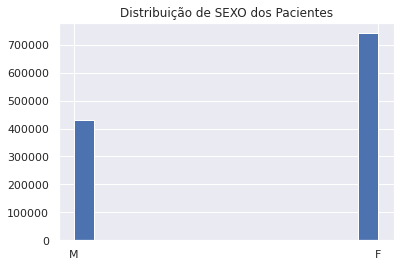

In [14]:

df.Sexo.hist(bins=15)
plt.title('Distribuição de SEXO dos Pacientes')
plt.show()

Vizualização de sexo por bairro


In [19]:
import plotly.express as px
grafico =  px.histogram (df,  x = "Nacionalidade", nbins=15, color='Sexo') 
grafico.update_layout(width=500,height=500,title_text='Distribuição de NACIONALIDADE por SEXO',
                      title_font_color = 'black') 
grafico.show()

In [20]:
import seaborn as sns

sns.histplot(df_enem, x="Qtde Prescrita Farmácia Curitibana", hue="SEXO", bins=len(bins))

NameError: ignored